<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I8kDikouqpH4hf7JBiSYAeNT2IO52T-T" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Generative adversarial networks</b></h3>



В этом домашнем задании вы обучите GAN генерировать лица людей и посмотрите на то, как можно оценивать качество генерации

In [1]:
import os
from PIL import Image
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import torch.nn.init as init
import cv2
from tqdm import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)
# torch.set_default_dtype(torch.float16)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

## Часть 1. Подготовка данных (1 балл)

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть. Скачать датасет можно [здесь](https://www.kaggle.com/datasets/tommykamaz/faces-dataset-small?resource=download-directory) и  [здесь](https://drive.google.com/drive/folders/14H7LQWzd09SaM11oLfGtd455sWH2rmRW?usp=share_link)

Давайте загрузим наши изображения. Напишите функцию, которая строит DataLoader для изображений, при этом меняя их размер до нужного значения (размер 1024 слишком большой, поэтому мы рекомендуем взять размер 128 либо немного больше)

In [2]:
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [3]:
def get_dataloader(image_size, batch_size):
    """
    Builds dataloader for training data.
    Use tt.Compose and tt.Resize for transformations\
    :param image_size: height and wdith of the image
    :param batch_size: batch_size of the dataloader
    :returns: DataLoader object 
    """
        
    # resize images, convert them to tensors and build dataloader
    normal_transforms = tt.Compose([
        tt.Resize(image_size),
        tt.ToTensor(),
        tt.Normalize(*stats)
    ])
    flip_transforms = tt.Compose([
        tt.Resize(image_size),
        tt.ToTensor(),
        tt.Normalize(*stats),
        tt.RandomHorizontalFlip(p=1)
    ])
    gaussian_transforms = tt.Compose([
        tt.Resize(image_size),
        tt.ToTensor(),
        tt.Normalize(*stats),
        tt.GaussianBlur(kernel_size=5, sigma=0.5)
    ])
    flip_gaussian_transforms = tt.Compose([
        tt.Resize(image_size),
        tt.ToTensor(),
        tt.Normalize(*stats),
        tt.GaussianBlur(kernel_size=5, sigma=0.5),
        tt.RandomHorizontalFlip(p=1)
    ])
    class HumanImageDeviceDataset(torch.utils.data.Dataset):
        def __init__(self, image_folder: str, transform: tt.Compose, device: str = "cuda:0"):
                self.image_folder = image_folder
                self.device = device
                self.transform = transform
                files = [os.path.join(image_folder, file) for file in os.listdir(image_folder)]
                self.images = [self._load_image(file) for file in files]
        
        def __len__(self):
            return len(self.images)
        
        def _load_image(self, file):
            image = Image.open(file)
            image = self.transform(image)
            return image.to(self.device)
        
        def __getitem__(self, item):
            return self.images[item]

    transforms = [normal_transforms, flip_transforms, gaussian_transforms, flip_gaussian_transforms]
    # transforms = [normal_transforms]
    datasets = [HumanImageDeviceDataset("./faces_dataset_small/faces", transform, device) for transform in transforms]
    dataset = torch.utils.data.ConcatDataset(datasets)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    return dataloader, datasets

In [4]:
image_size = 128
batch_size = 64
dataloader, datasets = get_dataloader(image_size, batch_size=batch_size)

## Часть 2. Построение и обучение модели (2 балла)

Сконструируйте генератор и дискриминатор. Помните, что:
* дискриминатор принимает на вход изображение (тензор размера `3 x image_size x image_size`) и выдает вероятность того, что изображение настоящее (тензор размера 1)

* генератор принимает на вход тензор шумов размера `latent_size x 1 x 1` и генерирует изображение размера `3 x image_size x image_size`

In [5]:
class MinibatchDiscrimination(nn.Module):
    def __init__(self, in_features, out_features, kernel_dims):
        super().__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.kernel_dims = kernel_dims

        self.T = nn.Parameter(torch.Tensor(in_features, out_features, kernel_dims))
        init.normal_(self.T, 0, 1)

    def forward(self, x):
        matrices = x.mm(self.T.view(self.in_features, -1))
        matrices = matrices.view(-1, self.out_features, self.kernel_dims)

        M = matrices.unsqueeze(0)
        M_T = M.permute(1, 0, 2, 3)
        norm = torch.abs(M - M_T).sum(3)
        expnorm = torch.exp(-norm)
        o_b = (expnorm.sum(0) - 1)

        x = torch.cat([x, o_b], 1)
        return x

# Generator
class Generator(nn.Module):
    def __init__(self, latent_dim, channels):
        super(Generator, self).__init__()
        
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 1024, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(1024),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Dropout2d(0.1),
            nn.ConvTranspose2d(64, channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        return self.model(z)

# Discriminator
class Discriminator(nn.Module):
    def __init__(self, channels):
        super(Discriminator, self).__init__()
        
        self.features = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(channels, 64, kernel_size=4, stride=2, padding=1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.1),
            nn.utils.spectral_norm(nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False)),
            #nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.1),
            nn.utils.spectral_norm(nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False)),
            #nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.1),
            nn.utils.spectral_norm(nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False)),
            #nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.1),
            nn.utils.spectral_norm(nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False)),
            #nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.1),
            nn.Conv2d(1024, 1024, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Flatten(),
        )

        self.classifier = nn.Sequential(
            MinibatchDiscrimination(1024, 128, 16),
            nn.Linear(1152, 128),
            nn.Linear(128, 1),
        )

    def forward(self, img):
        features = self.features(img)
        output = self.classifier(features)
        return output, features

latent_size = 256
channels = 3
generator = Generator(latent_size, channels).to(device)
discriminator = Discriminator(channels).to(device)

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь берем бинарную кросс-энтропию

In [6]:
lr = 0.0002
epochs = 50

model = {
    "discriminator": discriminator,
    "generator": generator
}

criterion = {
    "discriminator": nn.BCEWithLogitsLoss().to(device),
    "generator": nn.BCEWithLogitsLoss().to(device)
}

In [7]:
def fit(model, criterion, epochs, lr, start_idx=1):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), 
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr / 2, betas=(0.5, 0.999), weight_decay=0.001)
    }
    
    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images in tqdm(dataloader):
            # Train discriminator
            # Clear discriminator gradients
            optimizer["discriminator"].zero_grad()
            
            with torch.autocast(device_type="cuda"):
                # Pass real images through discriminator
                target_label = torch.randint(85, 95, (1,)).item()
                #if target_label % 5 == 0 or target_label % 5 == 1:
                    #real_images = tt.functional.gaussian_blur(real_images, 7)
                real_preds, real_features = model["discriminator"](real_images)
                real_targets = torch.full((real_images.size(0), 1), target_label / 100, device=device)
                real_loss = criterion["discriminator"](real_preds, real_targets)
                cur_real_score = torch.mean(real_preds).item()
                
                # Generate fake images
                latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
                target_label = torch.randint(0, 5, (1,)).item()
                fake_images = model["generator"](latent)
                #if target_label % 5 == 0 or target_label % 5 == 1:
                    #fake_images = tt.functional.gaussian_blur(fake_images, 7)
    
                # Pass fake images through discriminator
                fake_targets = torch.full((fake_images.size(0), 1), target_label / 100, device=device)
                fake_preds, fake_features = model["discriminator"](fake_images)
                fake_loss = criterion["discriminator"](fake_preds, fake_targets)
                cur_fake_score = torch.mean(fake_preds).item()
                
                feature_matching_loss = torch.mean(torch.abs(real_features.detach().mean(0) - fake_features.detach().mean(0)))
                del latent, target_label, real_preds, real_features, real_targets, fake_images, fake_preds, fake_features, fake_targets

            real_score_per_epoch.append(1 / (1 + np.exp(-cur_real_score)))
            fake_score_per_epoch.append(1 / (1 + np.exp(-cur_fake_score)))

            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Train generator
            # Clear generator gradients
            optimizer["generator"].zero_grad()

            with torch.autocast(device_type="cuda"):
                # Generate fake images
                latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
                target_label = torch.randint(85, 95, (1,)).item()
                fake_images = model["generator"](latent)
                #if target_label % 5 == 0 or target_label % 5 == 1:
                    #fake_images = tt.functional.gaussian_blur(fake_images, 7)
                
                # Try to fool the discriminator
                preds, _ = model["discriminator"](fake_images)
                targets = torch.full((fake_images.size(0), 1), target_label / 100, device=device)
                loss_g = criterion["generator"](preds, targets)
                del latent, target_label, fake_images, preds, targets
            
            # Update generator weights
            loss_g = loss_g + 30 * feature_matching_loss
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())
            
        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, 
            losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1]))

        if epoch % 10 == 0:
            latent = torch.randn(16, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)
            fig, ax = plt.subplots(figsize=(8, 8))
            ax.set_xticks([]); ax.set_yticks([])
            ax.imshow(make_grid(denorm(fake_images.cpu().detach()[:16]), nrow=4).permute(1, 2, 0))
            del latent, fake_images
            plt.show()
    
    return losses_g, losses_d, real_scores, fake_scores

100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.11s/it]


Epoch [1/50], loss_g: 10.4280, loss_d: 0.5154, real_score: 0.8702, fake_score: 0.0418


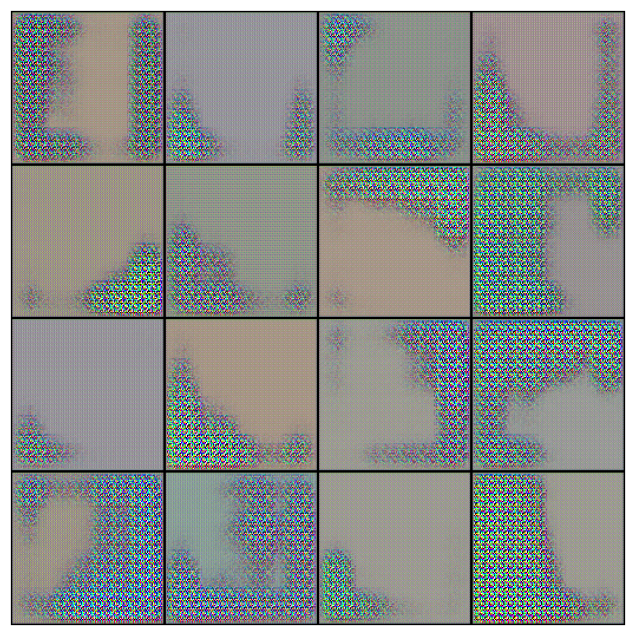

100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.11s/it]


Epoch [2/50], loss_g: 6.7406, loss_d: 0.8781, real_score: 0.8060, fake_score: 0.1354


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.12s/it]


Epoch [3/50], loss_g: 3.2043, loss_d: 1.0442, real_score: 0.6959, fake_score: 0.2980


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.11s/it]


Epoch [4/50], loss_g: 2.9221, loss_d: 1.0821, real_score: 0.6327, fake_score: 0.2722


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.12s/it]


Epoch [5/50], loss_g: 2.6085, loss_d: 1.0321, real_score: 0.6561, fake_score: 0.2665


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.12s/it]


Epoch [6/50], loss_g: 2.5022, loss_d: 0.9747, real_score: 0.6847, fake_score: 0.2248


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.12s/it]


Epoch [7/50], loss_g: 2.6724, loss_d: 0.9349, real_score: 0.7144, fake_score: 0.2224


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.12s/it]


Epoch [8/50], loss_g: 3.0513, loss_d: 0.8133, real_score: 0.7719, fake_score: 0.1412


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.12s/it]


Epoch [9/50], loss_g: 2.5426, loss_d: 0.9355, real_score: 0.7057, fake_score: 0.2087


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.12s/it]


Epoch [10/50], loss_g: 2.5410, loss_d: 0.8469, real_score: 0.7621, fake_score: 0.1721


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.12s/it]


Epoch [11/50], loss_g: 2.5110, loss_d: 0.8851, real_score: 0.7368, fake_score: 0.1826


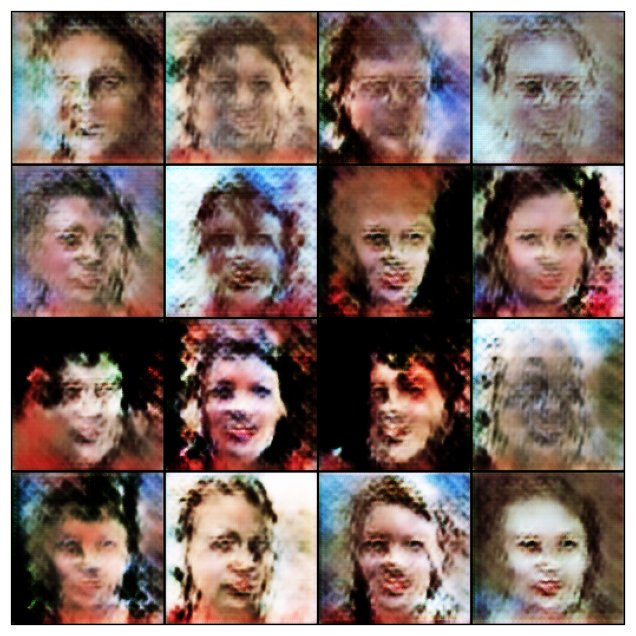

100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.12s/it]


Epoch [12/50], loss_g: 2.6744, loss_d: 0.7884, real_score: 0.7870, fake_score: 0.1418


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.12s/it]


Epoch [13/50], loss_g: 2.5344, loss_d: 0.8204, real_score: 0.7813, fake_score: 0.1517


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:39<00:00,  1.12s/it]


Epoch [14/50], loss_g: 2.7008, loss_d: 0.7533, real_score: 0.8066, fake_score: 0.1263


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:41<00:00,  1.12s/it]


Epoch [15/50], loss_g: 2.7341, loss_d: 0.7851, real_score: 0.7950, fake_score: 0.1378


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [16/50], loss_g: 2.7991, loss_d: 0.6967, real_score: 0.8305, fake_score: 0.1041


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [17/50], loss_g: 3.0539, loss_d: 0.6533, real_score: 0.8476, fake_score: 0.0849


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [18/50], loss_g: 3.1333, loss_d: 0.6311, real_score: 0.8587, fake_score: 0.0717


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [19/50], loss_g: 3.1999, loss_d: 0.6171, real_score: 0.8642, fake_score: 0.0651


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [20/50], loss_g: 3.3488, loss_d: 0.5800, real_score: 0.8733, fake_score: 0.0538


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [21/50], loss_g: 3.3503, loss_d: 0.5776, real_score: 0.8752, fake_score: 0.0504


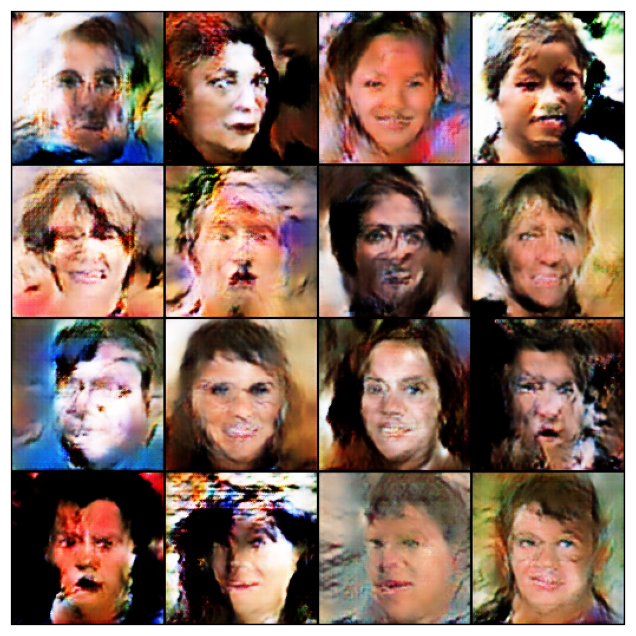

100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [22/50], loss_g: 3.3599, loss_d: 0.5643, real_score: 0.8781, fake_score: 0.0481


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [23/50], loss_g: 3.4489, loss_d: 0.5571, real_score: 0.8802, fake_score: 0.0410


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [24/50], loss_g: 3.5380, loss_d: 0.5349, real_score: 0.8842, fake_score: 0.0381


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [25/50], loss_g: 3.4013, loss_d: 0.5660, real_score: 0.8747, fake_score: 0.0485


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [26/50], loss_g: 3.5852, loss_d: 0.5266, real_score: 0.8856, fake_score: 0.0351


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [27/50], loss_g: 3.4432, loss_d: 0.5110, real_score: 0.8945, fake_score: 0.0341


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [28/50], loss_g: 3.4974, loss_d: 0.5211, real_score: 0.8884, fake_score: 0.0338


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [29/50], loss_g: 3.5202, loss_d: 0.5199, real_score: 0.8887, fake_score: 0.0363


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [30/50], loss_g: 3.4856, loss_d: 0.5136, real_score: 0.8915, fake_score: 0.0346


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [31/50], loss_g: 3.6383, loss_d: 0.4987, real_score: 0.8912, fake_score: 0.0301


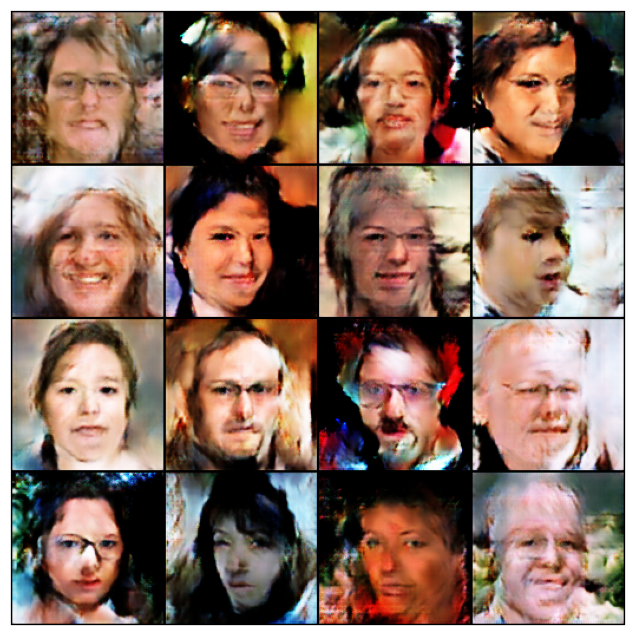

100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [32/50], loss_g: 3.5387, loss_d: 0.5140, real_score: 0.8881, fake_score: 0.0309


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [33/50], loss_g: 3.5697, loss_d: 0.4910, real_score: 0.8962, fake_score: 0.0283


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [34/50], loss_g: 3.5514, loss_d: 0.5133, real_score: 0.8822, fake_score: 0.0383


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [35/50], loss_g: 3.2458, loss_d: 0.5738, real_score: 0.8691, fake_score: 0.0558


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [36/50], loss_g: 3.4654, loss_d: 0.5094, real_score: 0.8916, fake_score: 0.0307


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [37/50], loss_g: 3.6016, loss_d: 0.4892, real_score: 0.8943, fake_score: 0.0281


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [38/50], loss_g: 3.5013, loss_d: 0.4858, real_score: 0.8970, fake_score: 0.0279


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [39/50], loss_g: 3.5326, loss_d: 0.4811, real_score: 0.8975, fake_score: 0.0283


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [40/50], loss_g: 3.6504, loss_d: 0.4887, real_score: 0.8926, fake_score: 0.0277


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [41/50], loss_g: 3.5820, loss_d: 0.4808, real_score: 0.8952, fake_score: 0.0268


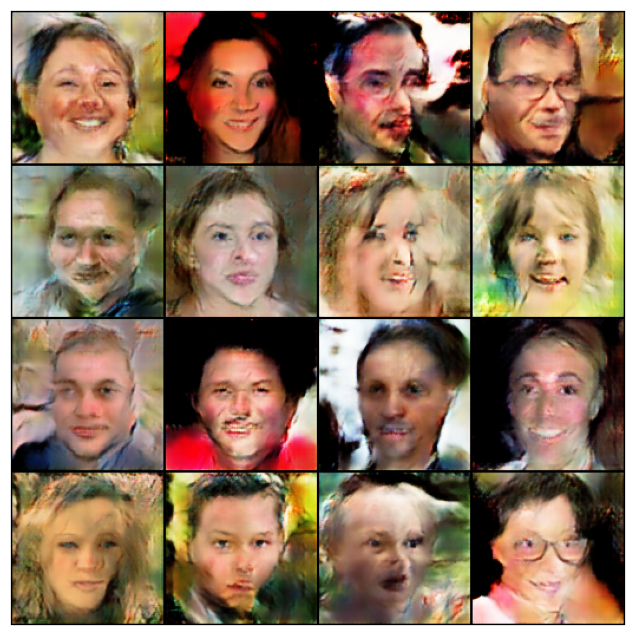

100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [42/50], loss_g: 3.5998, loss_d: 0.4808, real_score: 0.8959, fake_score: 0.0277


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [43/50], loss_g: 3.4670, loss_d: 0.4894, real_score: 0.8935, fake_score: 0.0290


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [44/50], loss_g: 3.5582, loss_d: 0.4846, real_score: 0.8941, fake_score: 0.0277


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [45/50], loss_g: 3.4781, loss_d: 0.5057, real_score: 0.8892, fake_score: 0.0317


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [46/50], loss_g: 3.5521, loss_d: 0.4808, real_score: 0.8952, fake_score: 0.0279


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [47/50], loss_g: 3.5912, loss_d: 0.4828, real_score: 0.8925, fake_score: 0.0266


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [48/50], loss_g: 3.5609, loss_d: 0.4863, real_score: 0.8911, fake_score: 0.0272


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]


Epoch [49/50], loss_g: 3.5405, loss_d: 0.4837, real_score: 0.8946, fake_score: 0.0281


100%|████████████████████████████████████████████████████████████████████████████████| 197/197 [03:40<00:00,  1.12s/it]

Epoch [50/50], loss_g: 3.5924, loss_d: 0.4787, real_score: 0.8931, fake_score: 0.0266


In [8]:
history = fit(model, criterion, epochs, lr)

Постройте графики лосса для генератора и дискриминатора. Что вы можете сказать про эти графики?

In [9]:
losses_g, losses_d, real_scores, fake_scores = history

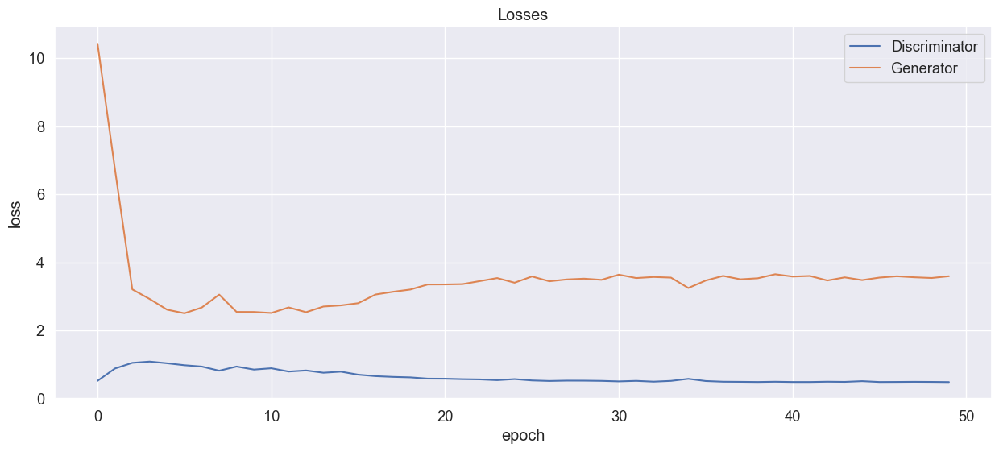

In [10]:
plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

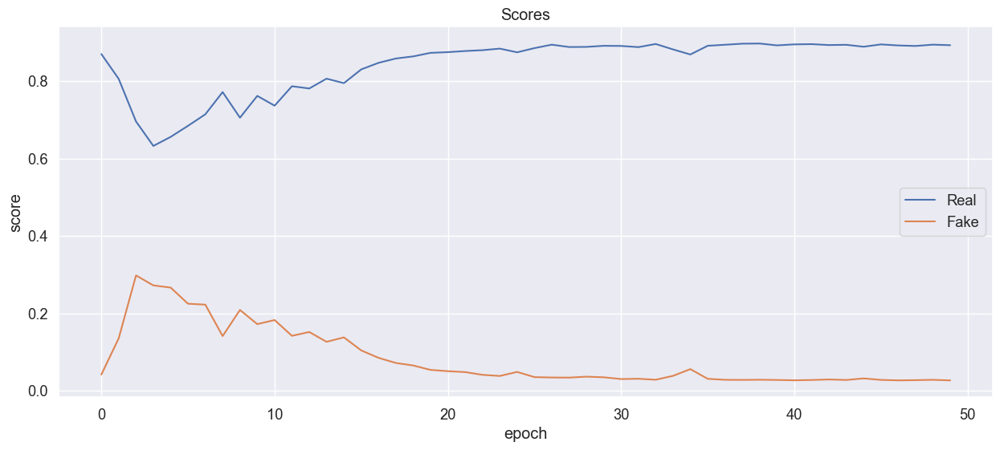

In [11]:
plt.figure(figsize=(15, 6))
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

## Часть 3. Генерация изображений (1 балл)

Теперь давайте оценим качество получившихся изображений. Напишите функцию, которая выводит изображения, сгенерированные нашим генератором

In [12]:
n_images_root = 6
n_images = n_images_root * n_images_root

fixed_latent = torch.randn(n_images, latent_size, 1, 1, device=device)
fake_images = model["generator"](fixed_latent)

In [13]:
def show_images(generated):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(generated.cpu().detach()[:n_images], nrow=n_images_root).permute(1, 2, 0)) 

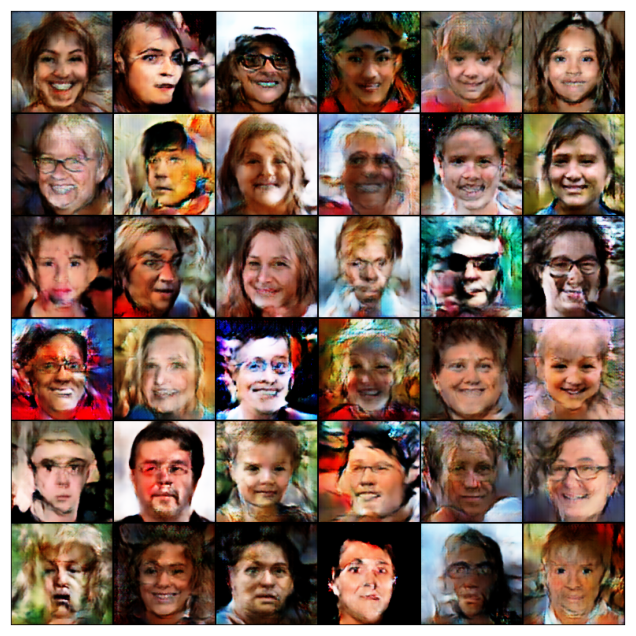

In [14]:
show_images(denorm(fake_images))

Как вам качество получившихся изображений?

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

### 4.1. Подсчет accuracy (4 балла)

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

In [15]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut, cross_val_score

n_samples = 1000
latent = torch.randn(n_samples, latent_size, 1, 1, device=device)
with torch.no_grad():
    model["generator"].eval()
    fake_images = model["generator"](latent).cpu().detach().view(-1, 49152)
real_images = torch.from_numpy(np.array([image.cpu().detach().numpy() for image in datasets[0].images][n_samples:n_samples * 2])).view(-1, 49152)
print(fake_images.shape)
      
fake_targets = torch.zeros(n_samples)
real_targets = torch.ones(n_samples)

images = torch.concat((fake_images, real_images), 0).detach().numpy()
targets = torch.concat((fake_targets, real_targets), 0).detach().numpy()

one_nn = KNeighborsClassifier(n_neighbors=1)
loo = LeaveOneOut()

scores = cross_val_score(one_nn, images, targets, scoring='accuracy', cv=loo, n_jobs=-1, verbose=10)
result = np.mean(scores)
result

torch.Size([1000, 49152])


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   27.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   28.1s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   37.0s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   39.8s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:   42.2s
[Parallel(n_jobs=-1)]: Done  61 tasks      | elapsed:   45.5s
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:   49.2s
[Parallel(n_jobs=-1)]: Done  89 tasks      | elapsed:   52.9s
[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:   56.3s
[Parallel(n_jobs=-1)]: Done 121 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 197 tasks      | elapsed:  

0.684

Что вы можете сказать о получившемся результате? Какой accuracy мы хотели бы получить и почему?

### 4.2. Визуализация распределений (2 балла)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

In [16]:
from sklearn.manifold import TSNE
import plotly.express as px

tsne = TSNE(n_components=2)
results = tsne.fit_transform(images)

Прокомментируйте получившийся результат:

In [17]:
fig = px.scatter(results, x=0, y=1, color=targets.astype(str), labels={'0': 'first-component', '1': 'second-component'})
fig.show()